In [2]:
from gbmi.exp_f_g.train import f_g_TrainingWrapper
from gbmi.exp_f_g.functions import add_sub, max_min
from gbmi import utils

from gbmi.exp_f_g.train import f_g_config

from gbmi.model import train_or_load_model

import torch
import einops
from torch import tensor
from math import *
from tqdm.auto import tqdm
import plotly.express as px
from gbmi.utils.sequences import generate_all_sequences
import pandas as pd

device = "cuda"

"""
with torch.no_grad():
    Eeq = model_max_min_4.W_E[-1] + model_max_min_4.W_pos[-1]
    for layer in range(model_max_min_4.W_Q.shape[0]):
        for head in range(model_max_min_4.W_Q.shape[1]):
            EQKE = (
                Eeq
                @ model_max_min_4.W_Q[layer, head]
                @ model_max_min_4.W_K[layer, head].T
                @ (model_max_min_4.W_E[:-1] - model_max_min_4.W_E[-1]).T
            )
            EQKP = (
                Eeq
                @ model_max_min_4.W_Q[layer, head]
                @ model_max_min_4.W_K[layer, head].T
                @ (model_max_min_4.W_pos[:-1] - model_max_min_4.W_pos[-1]).T
            )
            px.line(EQKE.cpu(), title=f"l{layer}h{head} EQKE").show()
            px.scatter(EQKP.cpu(), title=f"l{layer}h{head} EQKP").show()
"""

'\nwith torch.no_grad():\n    Eeq = model_max_min_4.W_E[-1] + model_max_min_4.W_pos[-1]\n    for layer in range(model_max_min_4.W_Q.shape[0]):\n        for head in range(model_max_min_4.W_Q.shape[1]):\n            EQKE = (\n                Eeq\n                @ model_max_min_4.W_Q[layer, head]\n                @ model_max_min_4.W_K[layer, head].T\n                @ (model_max_min_4.W_E[:-1] - model_max_min_4.W_E[-1]).T\n            )\n            EQKP = (\n                Eeq\n                @ model_max_min_4.W_Q[layer, head]\n                @ model_max_min_4.W_K[layer, head].T\n                @ (model_max_min_4.W_pos[:-1] - model_max_min_4.W_pos[-1]).T\n            )\n            px.line(EQKE.cpu(), title=f"l{layer}h{head} EQKE").show()\n            px.scatter(EQKP.cpu(), title=f"l{layer}h{head} EQKP").show()\n'

Seed set to 0


0


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

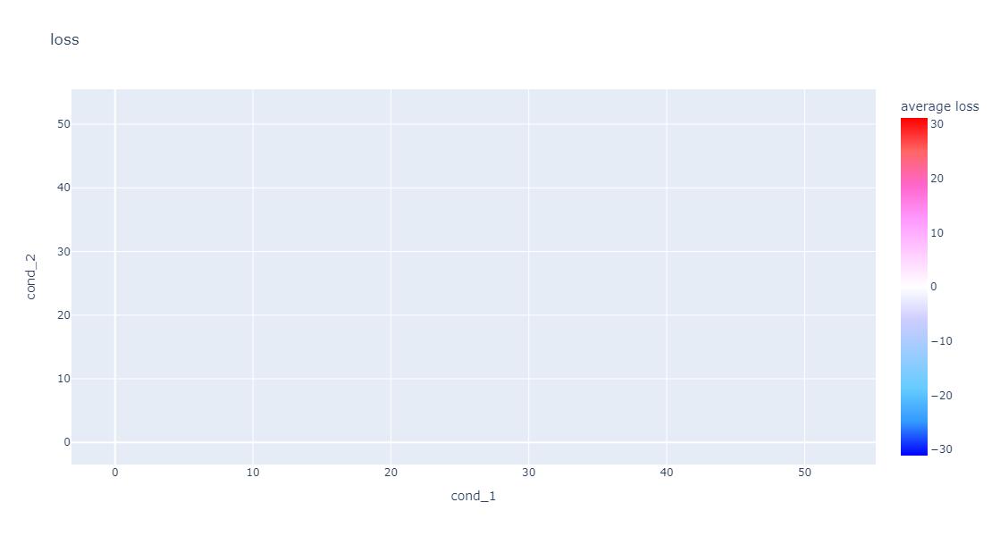

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

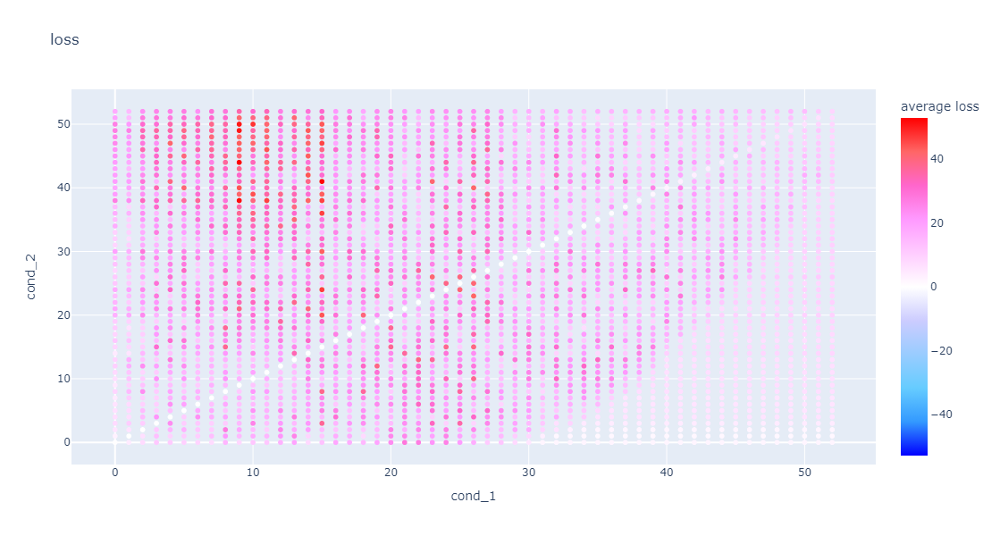

Seed set to 100


100


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

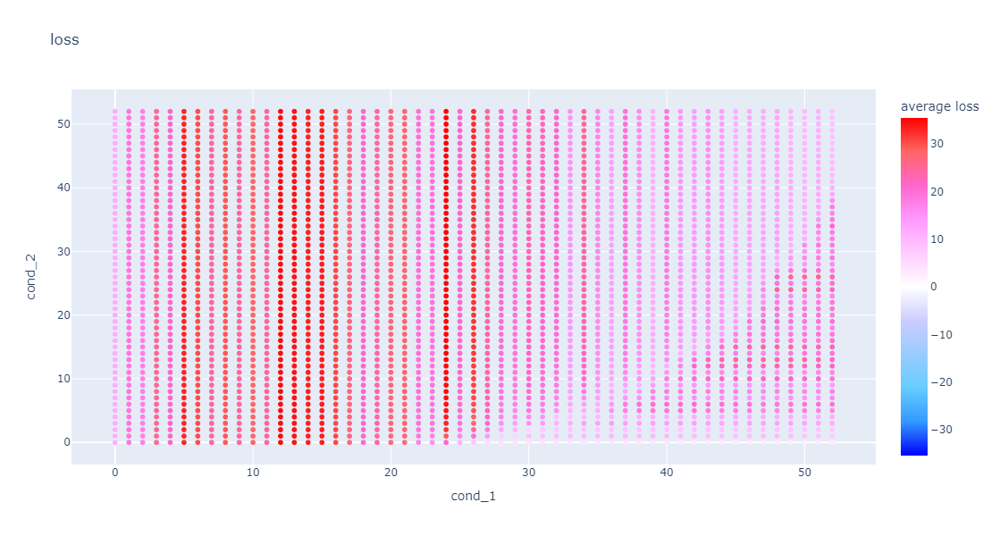

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

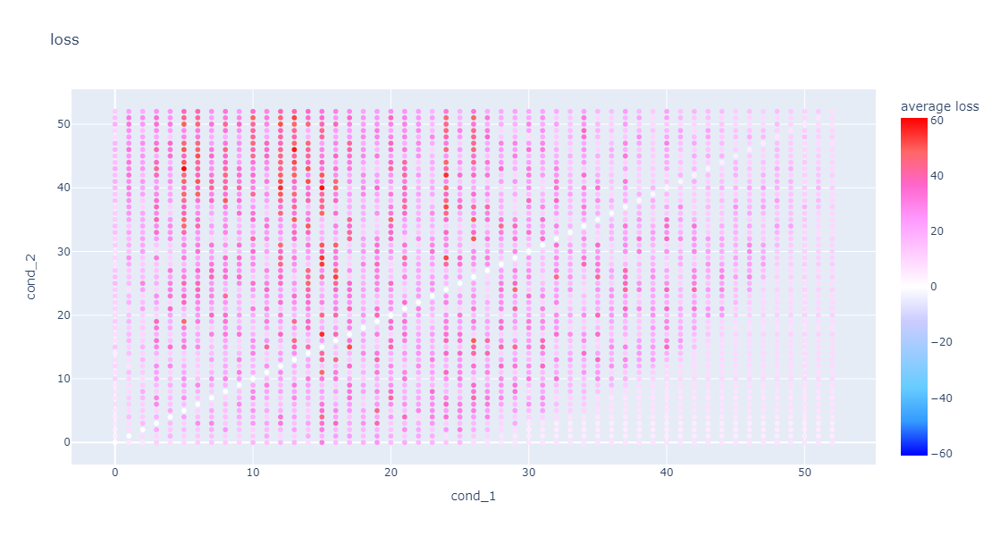

Seed set to 200


200


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

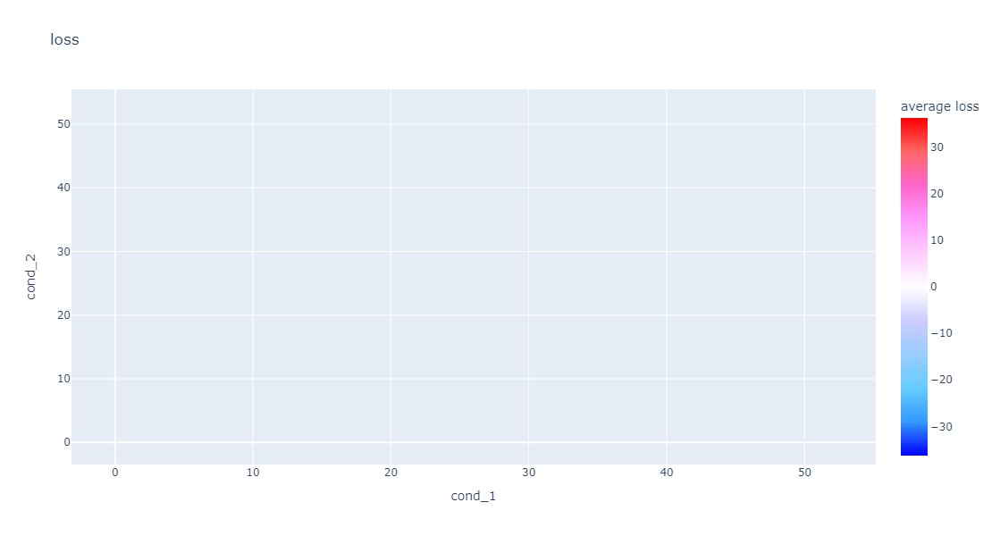

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

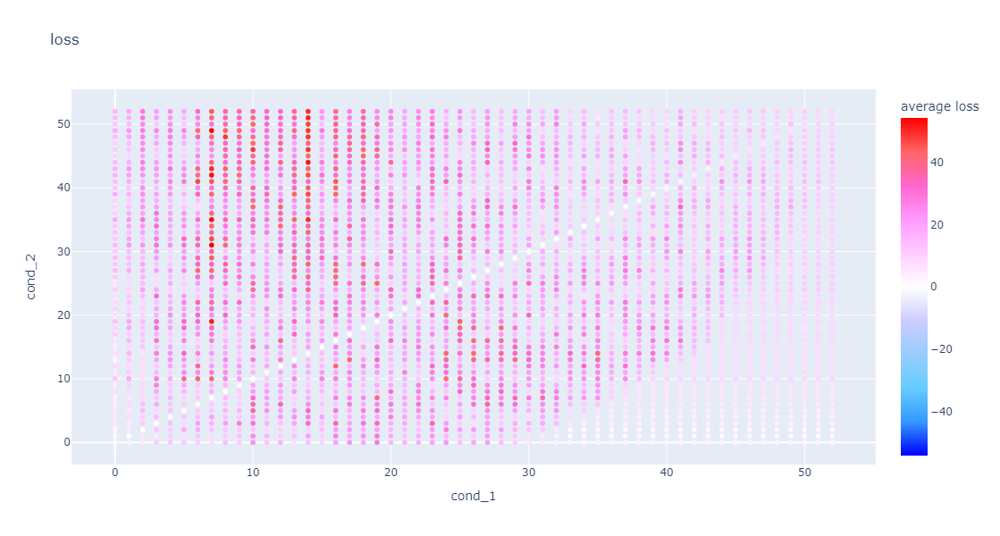

Seed set to 300


300


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

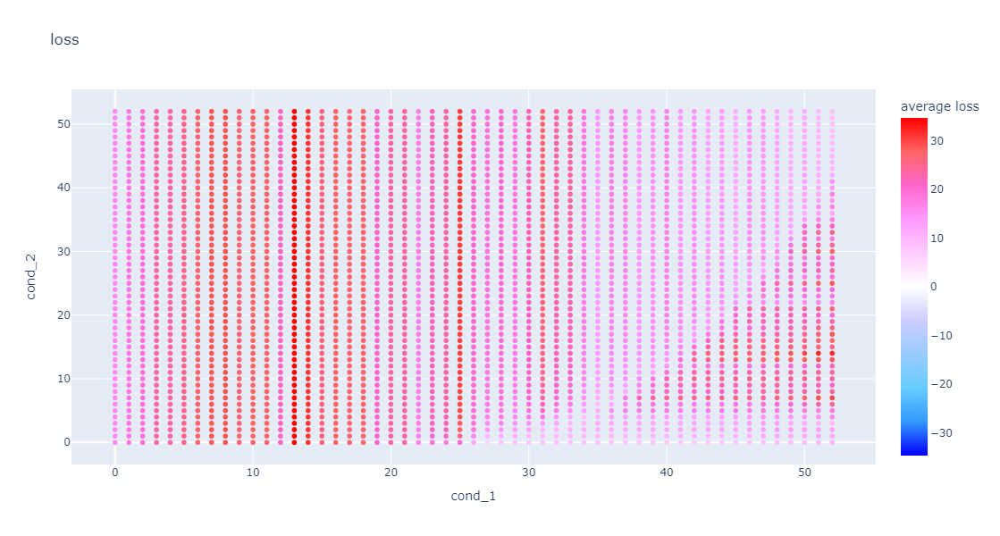

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

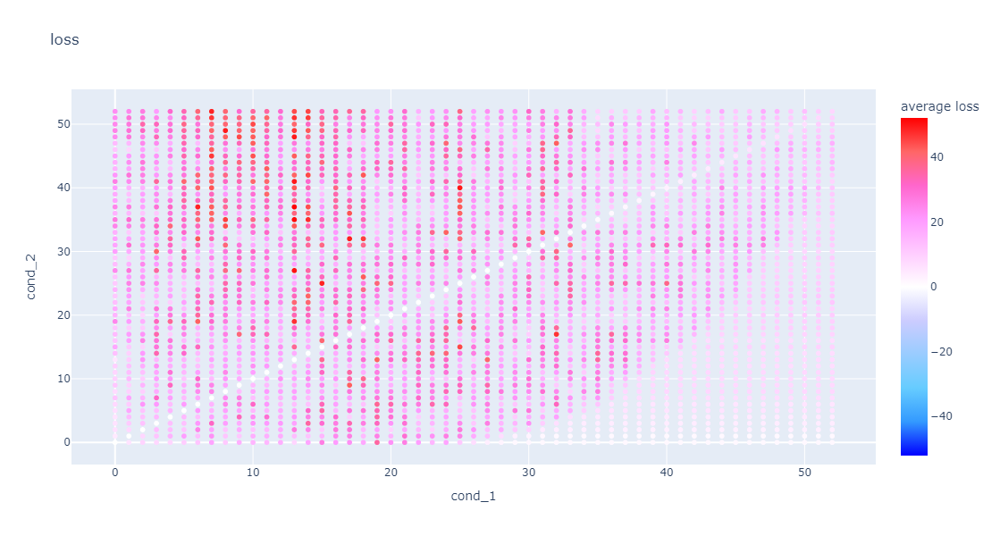

Seed set to 400


400


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

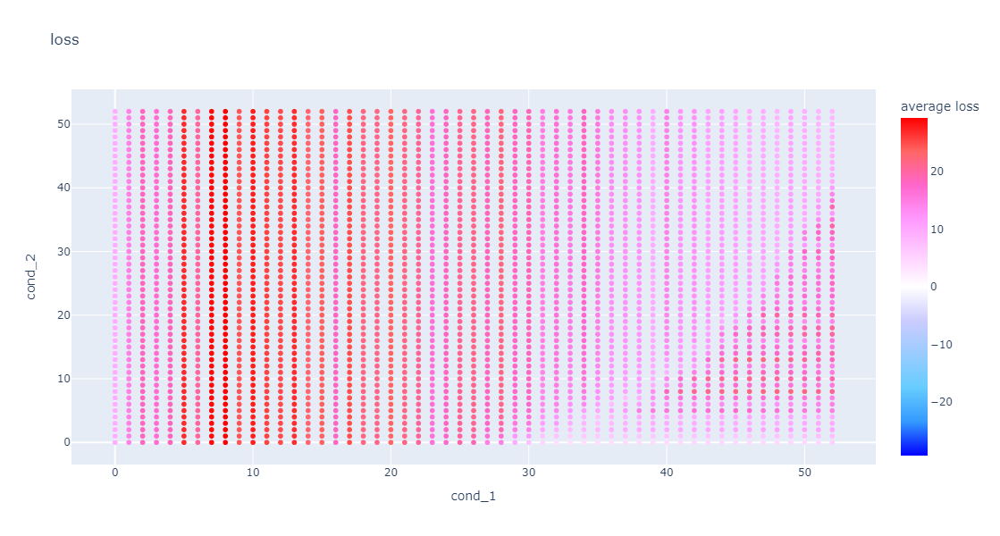

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

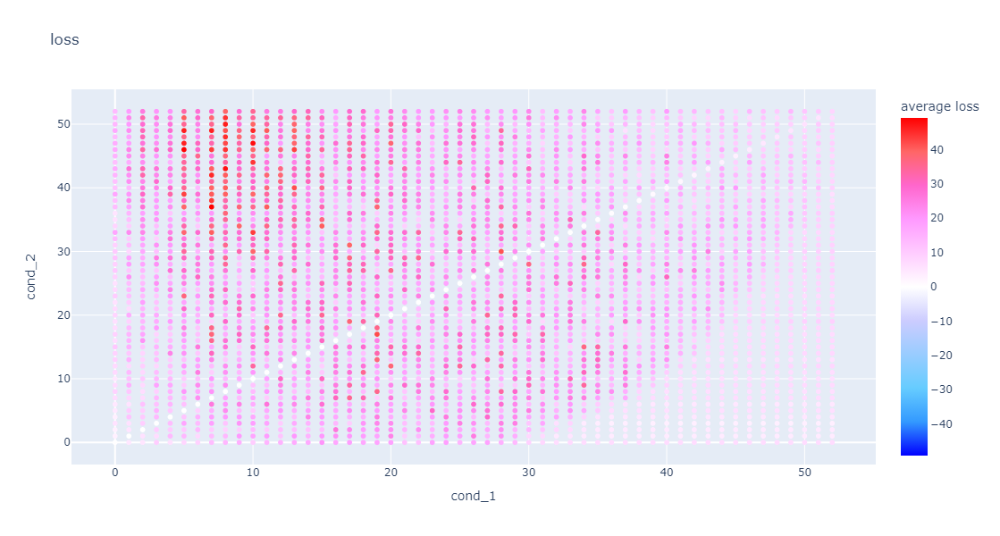

Seed set to 500


500


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Seed set to 600


600


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Seed set to 700


700


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Seed set to 800


800


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Seed set to 900


900


wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

In [3]:
"""

def testing(a, b):

    c = torch.tensor([[a, b, 0, 0, 53]])
    z = torch.tensor([[a, b, 0, 0, 53]])
    for i in range(53):
        c[0][2] = i
        for j in range(53):
            c[0][3] = j
            if (i, j) != (0, 0):
                z = torch.cat((z, c), dim=0)
    val = torch.argmax(model_max_min_1(z)[:, -1, :].squeeze(), dim=1).to(device)
    return torch.stack(
        ((val - max(a, b)), (val - torch.min(z[:, 2], z[:, 3]).to(device)))
    )


a = 0
b = 0
for i in range(53):
    for j in range(53):
        s = testing(i, j)
        c = torch.sum(abs(s[0]) >= abs(s[1]))
        d = torch.sum(torch.min(abs(s[0]), abs(s[1])) == 0)
        a += c
        b += d
        print((53 * i + j + 1) * 2809)
        print(a)
        print(b)
        print(c)
        print(d)

"""


def elemental_loss(mod, i, fun):
    logits = mod(i)[:, -1, :].to(torch.float64)
    log_probs = utils.log_softmax(logits, dim=-1)
    correct_log_probs = log_probs.gather(-1, fun(i).unsqueeze(-1))[:, 0]

    return -correct_log_probs


"""
def loss_scatter(mod, cond, max_is_min):
    pairs = generate_all_sequences(53, 4).to(device)
    data = (
        torch.cat([pairs, 53 * (torch.ones((len(pairs), 1)).to(device))], dim=1)
        .long()
        .to(device)
    )

    loss_values = {}



    for i in data:
        if not (max_is_min and not (torch.max(i[2:4]) == torch.min(i[:2]))):
            if cond(i) in loss_values:
                loss_values[cond(i)] = torch.cat(
                    [loss_values[cond(i)], elemental_loss(mod, i)]
                )
            else:
                loss_values[cond(i)] = torch.tensor([elemental_loss(mod, i)])
    print(loss_values[(torch.tensor(5), torch.tensor(50))])
    x_values = [key[0] for key in loss_values.keys()]
    y_values = [key[1] for key in loss_values.keys()]
    color_values = [value.mean().item() for value in loss_values.values()]

    # Create a DataFrame
    df = pd.DataFrame({"X": x_values, "Y": y_values, "Color": color_values})

    # Plot scatter diagram using Plotly Express
    fig = px.scatter(df, x="X", y="Y", color="Color", title="Scatter Diagram")
    fig.show()
"""


@torch.no_grad()
def loss_scatter(mod, cond, res, fun):

    mod.to(device)

    def cond_index(data):
        out = cond(data)
        return out[0] * 53 + out[1]

    pairs = generate_all_sequences(53, 4).to(device)
    data = torch.cat(
        [
            pairs,
            53 * (torch.ones((len(pairs), 1), device=pairs.device, dtype=torch.long)),
        ],
        dim=1,
    )

    loss_values = torch.zeros((53**2,), device=pairs.device, dtype=torch.float64)

    loss_values = []

    for sub_data in tqdm(torch.split(data, 53**2)):
        losses = elemental_loss(mod, sub_data, fun)
        loss_values.append(losses)

    loss_values = torch.cat(loss_values)

    losses = torch.zeros((53**2,), device=loss_values.device, dtype=loss_values.dtype)
    cond_indices = cond_index(data)
    if res is not None:
        res_mask = res(data)
        cond_indices = cond_indices[res_mask]
        loss_values = loss_values[res_mask]
    losses.scatter_reduce_(
        dim=0,
        index=cond_indices,
        src=loss_values,
        reduce="mean",
        include_self=False,
    )

    x_coords = torch.arange(53).repeat(53, 1).transpose(0, 1).flatten()
    y_coords = torch.arange(53).repeat(53, 1).flatten()

    fig = px.scatter(
        x=x_coords.numpy(),
        y=y_coords.numpy(),
        color=losses.cpu().numpy(),
        color_continuous_scale="Picnic",
        title="loss",
        labels={"color": "average loss"},
        width=800,
        height=600,
        color_continuous_midpoint=0,
    )

    fig.update_layout(
        xaxis_title="cond_1",
        yaxis_title="cond_2",
    )

    fig.show()


def min_max(i):
    return ((i[..., 2:4].min(dim=-1).values), (i[..., :2].max(dim=-1)).values)


def res_min_max(i):
    return i[..., 2:4].min(dim=-1).values == i[..., :2].max(dim=-1).values


def max_1(i):
    return i[..., :2].max(dim=-1).values


def min_2(i):
    return i[..., 2:4].max(dim=-1).values


for i in range(0, 1000, 100):
    print(i)
    max_min_1_head_CONFIG = f_g_config(fun=max_min(53, 2), n_head=1, elements=2, seed=i)
    runtime_max_min_1, model_max_min_1 = train_or_load_model(max_min_1_head_CONFIG)
    loss_scatter(model_max_min_1, min_max, None, min_2)
    loss_scatter(model_max_min_1, min_max, None, max_1)

In [4]:
max_min_1_head_CONFIG = f_g_config(fun=max_min(53, 2), n_head=1, elements=2, seed=999)
runtime_max_min_1, model_max_min_1 = train_or_load_model(max_min_1_head_CONFIG)
loss_scatter(model_max_min_1, min_max, None, True)
loss_scatter(model_max_min_1, min_max, None, False)


# print(torch.argmax(model_max_min_4(torch.tensor([0, 0, 17, 20, 53]))[:, -1, :]))

# model_add_sub_1.to(device)
# model_add_sub_2.to(device)
# model_max_min_4.to(device)
# model_max_min_2.to(device)

Seed set to 999
wandb:   1 of 1 files downloaded.  


Moving model to device:  cuda


  0%|          | 0/2809 [00:00<?, ?it/s]

TypeError: 'bool' object is not callable

In [ ]:
print(model_max_min_1(torch.tensor([51, 50, 10, 11, 53]))[:, -1, :].argmax(dim=-1))

: 